
# Disco Diffusion

This is an simple way of creating compelling [Disco Diffusion](http://discodiffusion.com) artworks for generative artists.


## References:

- [Disco Diffusion Cheatsheet](https://dreamingcomputers.com/disco-diffusion/disco-diffusion-cheatsheet/)
- [Zippy's Disco Diffusion Cheatsheet v0.3](https://docs.google.com/document/d/1l8s7uS2dGqjztYSjPpzlmXLjl5PM3IGkRWI3IiCuK7g/mobilebasic)
- [Disco Diffusion Illustrated Settings](https://mpaugam.notion.site/Disco-Diffusion-Illustrated-Settings-cd4badf06e08440c99d8a93d4cd39f51)
- [EZ Charts - Diffusion Parameter Studies](https://docs.google.com/document/d/1ORymHm0Te18qKiHnhcdgGp-WSt8ZkLZvow3raiu2DVU/edit#)
- [Coar’s Disco Diffusion Guide](https://coar.notion.site/coar/Coar-s-Disco-Diffusion-Guide-3d86d652c15d4ca986325e808bde06aa#8a3c6e9e4b6847afa56106eacb6f1f79)
- [A Traveler’s Guide to the Latent Space](https://sweet-hall-e72.notion.site/A-Traveler-s-Guide-to-the-Latent-Space-85efba7e5e6a40e5bd3cae980f30235f#e122e748b86e4fc0ad6a7a50e46d6e10)


## Install or upgrade of ekorpkit

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```{toggle}
%%capture
!pip install ekorpkit[disco]
exit()
```

In [4]:
# eKonf.upgrade(prelease=True, quiet=False, verbose=True, force_reinstall=False)

## Prepare an environment

In [1]:
from ekorpkit import eKonf

eKonf.setLogger("INFO")
eKonf.set_cuda(device=4)
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive(
        workspace="MyDrive/colab_workspace", project="disco-imagen"
    )

print("environment variables:")
eKonf.print(eKonf.env().dict())

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB (id:4)']
INFO:ekorpkit.utils.notebook:shell type: ZMQInteractiveShell
INFO:ekorpkit.utils.notebook:Google Colab not detected.


version: 0.1.38+30.g9d5fcfc.dirty
is notebook? True
is colab? False
environment variables:
{'CUDA_DEVICE_ORDER': 'PCI_BUS_ID',
 'CUDA_VISIBLE_DEVICES': '4',
 'EKORPKIT_CONFIG_DIR': '/workspace/projects/ekorpkit-book/config',
 'EKORPKIT_DATA_DIR': None,
 'EKORPKIT_LOG_LEVEL': 'INFO',
 'EKORPKIT_PROJECT': 'ekorpkit-book',
 'EKORPKIT_WORKSPACE_ROOT': '/workspace',
 'KMP_DUPLICATE_LIB_OK': 'TRUE',
 'NUM_WORKERS': 230}


## Create a disco instance

In [2]:
cfg = eKonf.compose("model/disco")
disco = eKonf.instantiate(cfg)
print(f"Version: {disco.version}")

INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.utils.notebook:shell type: ZMQInteractiveShell
INFO:ekorpkit.base:setting environment variable CACHED_PATH_CACHE_ROOT to /workspace/.cache/cached_path
INFO:ekorpkit.base:setting environment variable KMP_DUPLICATE_LIB_OK to TRUE
INFO:ekorpkit.models.art.base:> downloading models...
INFO:ekorpkit.models.disco.base:Downloading model 256x256_diffusion_uncond from {'SHA': '983e3de6f95c88c81b2ca7ebb2c217933be1973b1ff058776b970f901584613a', 'filename': '256x256_diffusion_uncond.pt', 'link': 'https://openaipublic.blob.core.windows.net/diffusion/jul-2021/256x256_diffusion_uncond.pt', 'link_fb': 'https://www.dropbox.com/s/9tqnqo930mpnpcn/256x256_diffusion_uncond.pt', 'archive_path': '/workspace/data/archive/disco-imagen/models/256x256_diffusion_uncond.pt', 'path': '/workspace/projects/ekorpkit-book/disco-imagen/models/256x256_diffusion_uncond.pt'}
INFO:ekorpkit.models.disco.utils:Model 256x256_diffusi

INFO:ekorpkit.models.disco.utils:Model model-lpips already downloaded, set check_model_SHA to true if the file is corrupt
INFO:ekorpkit.models.disco.base:Downloading model AdaBins from {'filename': 'AdaBins_nyu.pt', 'link': 'https://cloudflare-ipfs.com/ipfs/Qmd2mMnDLWePKmgfS8m6ntAg4nhV5VkUyAydYBp8cWWeB7/AdaBins_nyu.pt', 'archive_path': '/workspace/data/archive/disco-imagen/pretrained/AdaBins_nyu.pt', 'path': '/workspace/projects/ekorpkit-book/disco-imagen/pretrained/AdaBins_nyu.pt'}
INFO:ekorpkit.models.disco.utils:Model AdaBins already downloaded, set check_model_SHA to true if the file is corrupt
INFO:ekorpkit.models.disco.base:Downloading model RN50 from {'filename': 'RN50.pt', 'link': 'https://openaipublic.azureedge.net/clip/models/afeb0e10f9e5a86da6080e35cf09123aca3b358a0c3e3b6c78a7b63bc04b6762/RN50.pt', 'archive_path': '/workspace/data/archive/disco-imagen/clip/RN50.pt', 'path': '/root/.cache/clip/RN50.pt'}
INFO:ekorpkit.models.disco.utils:Model RN50 already downloaded, set check

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth
Version: v5.61


## Image only mode

In [4]:
disco.config.models.openclip_models.RN101_quickgelu_yfcc15m = True
disco.config.models.openclip_models.ViTB32_laion2b_e16 = True
disco.config.models.diffusion_model = "watercolordiffusion"
eKonf.print(disco.config.models)
# If you change model configs, you have to reload models
disco.load_models()

INFO:ekorpkit.models.disco.base:> loading diffusion models...
INFO:ekorpkit.models.disco.base:Using device:cuda:4
INFO:ekorpkit.models.disco.base:Disabling CUDNN for A100 gpu
INFO:ekorpkit.models.disco.base:Loading diffusion model: watercolordiffusion
INFO:ekorpkit.models.disco.base:Loading secondary model: /workspace/projects/ekorpkit-book/disco-imagen/models/secondary_model_imagenet_2.pth
INFO:ekorpkit.models.disco.base:> loading clip models...


{'clip_models': {'RN101': False,
                 'RN50': False,
                 'RN50x16': False,
                 'RN50x4': False,
                 'RN50x64': False,
                 'ViTB16': True,
                 'ViTB32': True,
                 'ViTL14': False,
                 'ViTL14_336px': False},
 'custom_model': 'ema_0.9999_058000.pt',
 'diffusion_model': 'watercolordiffusion',
 'openclip_models': {'RN101_quickgelu_yfcc15m': True,
                     'RN101_yfcc15m': False,
                     'RN50_cc12m': True,
                     'RN50_quickgelu_cc12m': False,
                     'RN50_quickgelu_yfcc15m': False,
                     'RN50_yffcc15m': False,
                     'ViTB16_laion400m_e31': False,
                     'ViTB16_laion400m_e32': False,
                     'ViTB32_laion2b_e16': True,
                     'ViTB32_laion400m_e31': False,
                     'ViTB32_laion400m_e32': True,
                     'ViTB32quickgelu_laion400m_e31': False

INFO:root:Loading ViT-B-32 model config.
INFO:root:Loading pretrained ViT-B-32 weights (laion2b_e16).
INFO:root:Loading ViT-B-32 model config.
INFO:root:Loading pretrained ViT-B-32 weights (laion400m_e32).
INFO:root:Loading RN50 model config.
INFO:root:Loading pretrained RN50 weights (cc12m).
INFO:root:Loading RN101-quickgelu model config.
INFO:root:Loading pretrained RN101-quickgelu weights (yfcc15m).


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth


jeju(6) samples:   0%|          | 0/2 [00:00<?, ?it/s]

INFO:ekorpkit.models.disco.base:Image prompt: []
INFO:ekorpkit.models.disco.base:Sample 1 Prompt: ['A beautiful painting of Jeju Island.']
INFO:ekorpkit.utils.notebook:shell type: ZMQInteractiveShell


Output()

  0%|          | 0/190 [00:00<?, ?it/s]

INFO:ekorpkit.models.disco.base:Saved jeju(6)_0001.png
INFO:ekorpkit.models.disco.base:Seed used: 3610975411
INFO:ekorpkit.models.disco.base: >> elapsed time to diffuse: 0:11:05.648947
INFO:ekorpkit.models.art.base:Merging config with args: {}
INFO:ekorpkit.models.art.base:Prompt: A beautiful painting of Jeju Island.


2 samples generated to /workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/jeju
text prompts: A beautiful painting of Jeju Island.
sample image paths:
/workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/jeju/jeju(6)_0000.png
/workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/jeju/jeju(6)_0001.png


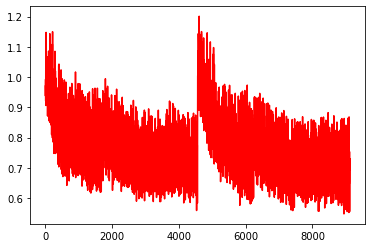

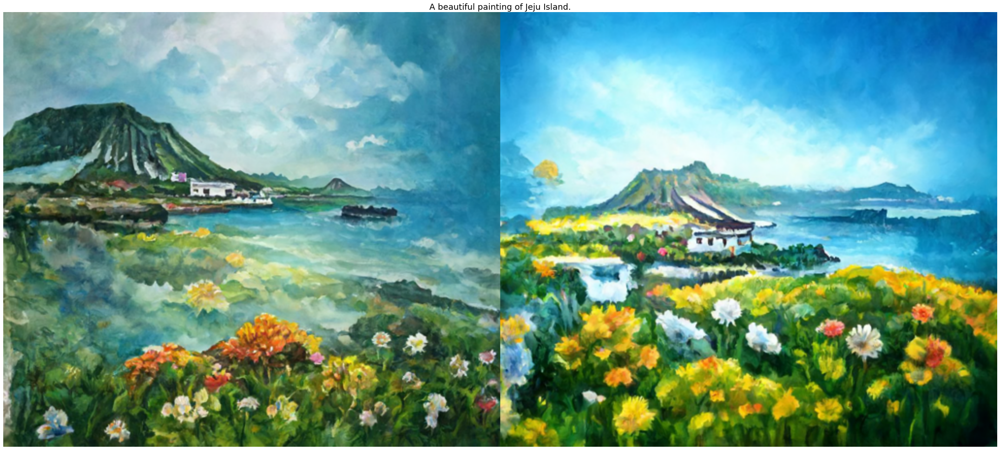

INFO:ekorpkit.models.art.base:Saving config to /workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/jeju/jeju(6)_settings.yaml


In [5]:
text_prompts = "A beautiful water painting of Jeju Island."
batch_name = "jeju"

results = disco.imagine(
    text_prompts, 
    batch_name=batch_name, 
    n_samples=2, 
    steps=200,
    show_collage=True,
    diffusion_sampling_mode='ddim',
    clip_guidance_scale=7500, 
    use_secondary_model=False,
)

In [6]:
results

{'image_filepaths': ['/workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/jeju/jeju(6)_0000.png',
  '/workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/jeju/jeju(6)_0001.png'],
 'config_file': 'jeju(6)_settings.yaml',
 'config': {'animation_mode': 'None',
  'batch_name': 'jeju',
  'display_rate': 20,
  'n_samples': 2,
  'batch_size': 1,
  'resume_run': False,
  'run_to_resume': 'latest',
  'resume_from_frame': 'latest',
  'retain_overwritten_frames': True,
  'show_collage': True,
  'diffusion_sampling_mode': 'ddim',
  'use_secondary_model': False,
  'steps': 200,
  'width_height': [512, 448],
  'width_height_for_512x512_models': [1280, 768],
  'width_height_for_256x256_models': [512, 448],
  'clip_guidance_scale': 7500,
  'tv_scale': 0,
  'range_scale': 150,
  'sat_scale': 0,
  'cutn_batches': 4,
  'skip_augs': False,
  'init_image': 'None',
  'init_scale': 1000,
  'skip_steps': 10,
  'frames_scale': 1500,
  'frames_skip_steps': '60%',
  'video_in

## 3D animation mode

In [ ]:
text_prompts = {
    0: "A beautiful new world in Jeju, artstation matte painting.",
    100: "Beautiful mountains in Jeju, artstation matte painting.",
    300: "A beautiful sea in Jeju, artstation matte painting.",
    500: "A beautiful woman in Jeju, artstation matte painting.",
    700: "A beautiful wind in Jeju, artstation matte painting.",
    900: "A beautiful new world in Jeju, artstation matte painting.",
}    
batch_name = "newworld-3d"

disco.imagine(
    text_prompts, 
    batch_name=batch_name, 
    batch_num=11,
    resume_run=True,
    steps=300,
    animation_mode="3D",
    rotation_3d_z="0: (0), 500: (1), 600: (-1)",
#     perlin_init=True,
#     perlin_mode="color",
    diffusion_sampling_mode='ddim',
    max_frames = 5000,
    width_height = [768, 512], 
    clip_guidance_scale=7500, 
)

newworld-3d(11) frames:   0%|          | 0/5000 [00:00<?, ?it/s]

INFO:ekorpkit.models.disco.base:translation_x: 0.0
INFO:ekorpkit.models.disco.base:translation_y: 0.0
INFO:ekorpkit.models.disco.base:translation_z: 10.0
INFO:ekorpkit.models.disco.base:rotation_3d_x: 0.0
INFO:ekorpkit.models.disco.base:rotation_3d_y: 0.0
INFO:ekorpkit.models.disco.base:rotation_3d_z: -0.6799999999999999
INFO:ekorpkit.models.disco.base:translation: [-0.0, 0.0, -0.05]
INFO:ekorpkit.models.disco.base:rotation: [0.0, 0.0, -0.6799999999999999]
INFO:ekorpkit.models.disco.base:rot_mat: tensor([[[ 1.0000,  0.0119,  0.0000],
         [-0.0119,  1.0000,  0.0000],
         [ 0.0000,  0.0000,  1.0000]]], device='cuda:4')
INFO:ekorpkit.models.disco.disco_xform_utils:Running AdaBins depth estimation implementation...


Loading base model ()...

Using cache found in /root/.cache/torch/hub/rwightman_gen-efficientnet-pytorch_master


Done.
Removing last two layers (global_pool & classifier).
Building Encoder-Decoder model..Done.


INFO:ekorpkit.models.disco.disco_xform_utils:Running MiDaS depth estimation implementation...


## 2D animation mode

In [ ]:
text_prompts = "Brave and beautiful new world in Jeju, artstation matte painting."
batch_name = "newworld-2d"

disco.imagine(
    text_prompts, 
    batch_name=batch_name, 
    steps=300,
    animation_mode = '2D',
#     rotation_3d_z="0: (1)",
#     perlin_init=True,
#     perlin_mode="color",
    diffusion_sampling_mode='ddim',
    max_frames = 50,
    width_height = [768, 512], 
    clip_guidance_scale=7500, 
)

## Video Input Mode

newworld-video(0) frames:   0%|          | 0/5 [00:00<?, ?it/s]

INFO:ekorpkit.models.disco.base:warping frames with flow blend ratio: 0.999
INFO:ekorpkit.models.disco.base:Image prompt: []
INFO:ekorpkit.models.disco.base:Frame 4 Prompt: ['A beautiful new world in Jeju, artstation matte painting.']


Output()

  0%|          | 0/40 [00:00<?, ?it/s]

INFO:ekorpkit.models.disco.base:Seed used: 3402861987
INFO:ekorpkit.models.disco.base: >> elapsed time to diffuse: 0:02:33.218085
INFO:ekorpkit.models.art.base:Saving config to /workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/newworld-video/newworld-video(0)_settings.yaml


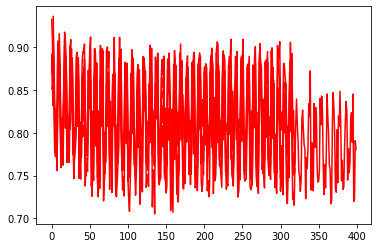

In [ ]:
text_prompts = "A beautiful new world in Jeju, artstation matte painting."
batch_name = "newworld-video"

disco.imagine(
    text_prompts, 
    batch_name=batch_name, 
    steps=250,
    animation_mode="Video Input",
    video_init_path="/workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/newworld-3d/newworld-3d(9).mp4",
#     rotation_3d_z="0: (1)",
#     perlin_init=True,
#     perlin_mode="color",
    diffusion_sampling_mode='ddim',
    max_frames = 10,
    width_height = [768, 512], 
    clip_guidance_scale=7500, 
)

## Create a video from output frames

In [ ]:
batch_name = "newworld-video"
batch_num = 0

mp4_path = disco.create_video(
    batch_name=batch_name, 
    batch_num=batch_num, 
)

  0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
from IPython.display import Video

Video(mp4_path, embed=True)

## collage generated sample images

INFO:ekorpkit.models.dalle.base:Loading config from /workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/halla/halla(4)_settings.yaml
INFO:ekorpkit.models.dalle.base:Merging config with diffuse defaults
INFO:ekorpkit.models.disco.base:Will save every 2 steps
INFO:ekorpkit.models.disco.base:Using seed: 221812581
INFO:ekorpkit.models.dalle.base:Prompt: Mt. Halla's beautiful flowers, artstation matte painting
INFO:ekorpkit.io.file:Processing [4] files from ['halla(4)_*.png']


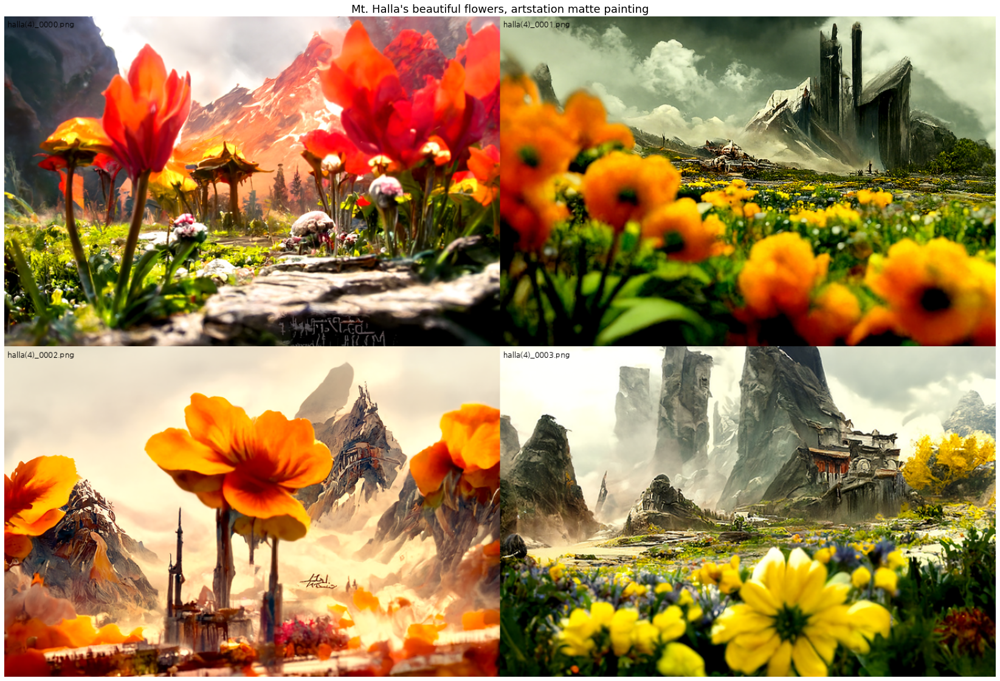

In [ ]:
disco.collage(
    batch_name=batch_name,
    batch_num=4,
    ncols=2,
    num_images=4,
    show_filename=True,
    fontcolor="black",
)


## make gif of progresses of a specific sample image

In [ ]:
disco.make_gif(
    batch_name='halla',
    batch_num=1,
    sample_num=1,
    show=False,
    duration=100,
    force_remake=True,
)

Saved GIF to /workspace/projects/ekorpkit-book/disco-imagen/outputs/halla/halla(1)_0001.gif


### show config

In [ ]:
disco.show_config(batch_name=batch_name, batch_num=4)

INFO:ekorpkit.models.disco.base:Loading config from /workspace/projects/ekorpkit-book/disco-imagen/outputs/halla/halla(4)_settings.yaml
INFO:ekorpkit.models.disco.base:Merging config with diffuse defaults
INFO:ekorpkit.models.disco.base:Merging config with args: {}
INFO:ekorpkit.models.disco.base:Will save every 2 steps
INFO:ekorpkit.models.disco.base:Using seed: 3370684779


{'angle': '0:(0)',
 'animation_mode': 'None',
 'batch_name': 'halla',
 'batch_num': 7,
 'batch_size': 1,
 'calc_frames_skip_steps': 150,
 'clamp_grad': True,
 'clamp_max': 0.05,
 'clip_denoised': False,
 'clip_guidance_scale': 5000,
 'cut_ic_pow': 1,
 'cut_icgray_p': '[0.2]*400+[0]*600',
 'cut_innercut': '[4]*400+[12]*600',
 'cut_overview': '[12]*400+[4]*600',
 'cutn_batches': 4,
 'display_rate': 20,
 'eta': 0.8,
 'extract_nth_frame': 2,
 'far_plane': 10000,
 'force_flow_generation': False,
 'fov': 40,
 'frames_scale': 1500,
 'frames_skip_steps': '60%',
 'fuzzy_prompt': False,
 'image_prompts': None,
 'init_image': 'None',
 'init_scale': 1000,
 'intermediate_saves': 250,
 'intermediates_in_subfolder': True,
 'interp_spline': 'Linear',
 'key_frames': True,
 'max_frames': 1,
 'midas_depth_model': 'dpt_large',
 'midas_weight': 0.3,
 'n_samples': 4,
 'near_plane': 200,
 'padding_mode': 'border',
 'perlin_init': False,
 'perlin_mode': 'mixed',
 'persistent_frame_output_in_batch_folder': Tru

## Model Parameters

In [ ]:
disco.parameters()

{'advanced': {'clamp_grad': "true {type: 'boolean'}",
              'clamp_max': "0.05 {type: 'number'}",
              'eta': "0.8 {type: 'number'}",
              'set_seed': "random_seed {type: 'string'}"},
 'advanced_extra': {'clip_denoised': 'false',
                    'fuzzy_prompt': 'false',
                    'rand_mag': '0.05',
                    'randomize_class': 'true'},
 'advanced_perlin_init': {'perlin_init': "false {type: 'boolean'} : Perlin "
                                         'init will replace your init',
                          'perlin_mode': "mixed ['mixed', 'color', 'gray']"},
 'animation_2d': {'angle': "'0:(0)' {type: 'string'} : All rotations are "
                           'provided in degrees.',
                  'far_plane': "10000 {type: 'number'}",
                  'fov': "40 {type: 'number'}",
                  'interp_spline': 'Linear '
                                   "['Linear','Quadratic','Cubic']{type: "
                                 

In [ ]:
disco.parameters("display")

[display_rate]
20 {type: 'number'}

